In [1]:
#import library
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

In [2]:
def insertGambar(folder):
    images = []
    filenames = []
    datalabel = []
    for label in os.listdir(folder):
        datalabel.append(label)
        file = []
        for filename in os.listdir("Batik/"+label):
            img = cv.imread(os.path.join("Batik/"+label,filename))
            file.append(filename)
            if img is not None:
                images.append(img)
        filenames.append(file)
    return images, filenames, datalabel

images, filenames, label = insertGambar("Batik")

In [3]:
def Image_Show(filenames,label):
    plt.figure(figsize=(50,75))
    k=0
    for i in range (len(label)):
        for j in range (20):
            img=plt.imread("Batik/"+label[i]+"/"+filenames[i][j])
            k+=1
            plt.subplot(20,5,k)
            plt.title(filenames[i][j])
            plt.imshow(img)

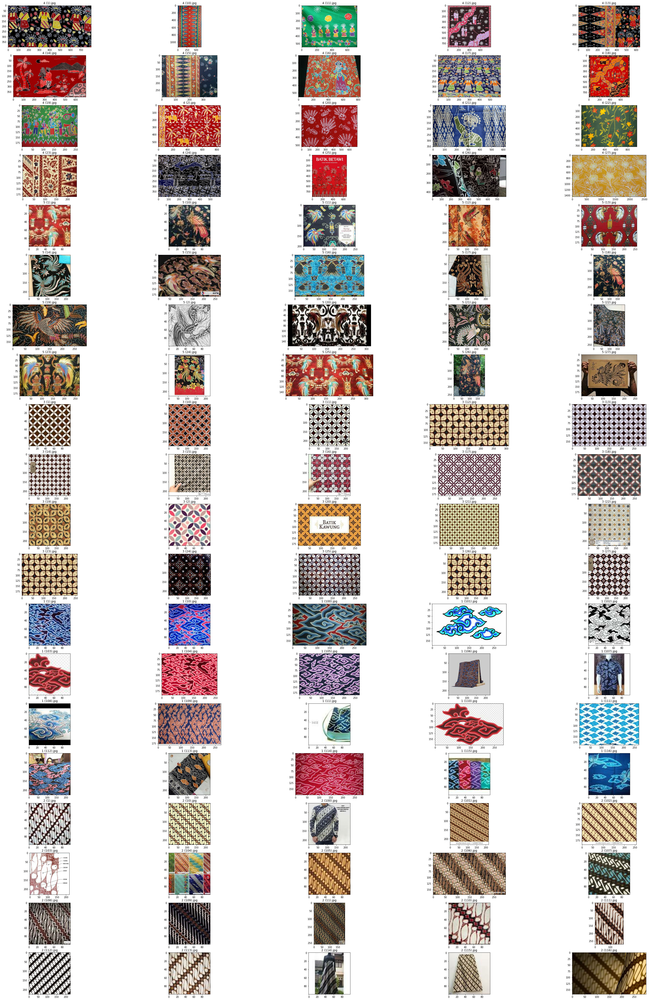

In [4]:
Image_Show(filenames, label)


In [5]:
# Fungsi untuk Membuat Matriks Kookurensi
def kookurensi(img, agl):
    matriks = np.zeros([256,256])
    x,y = img.shape
    
    if(agl==0):
        for i in range(x):
            for j in range(y-1):
                matriks[img[i,j], img[i,j+1]] += 1
                
    elif(agl==45):
        for i in range(1,x):
            for j in range(y-1):
                matriks[img[i,j], img[i-1,j+1]] += 1
    
    elif(agl==90):
        for i in range(1,x):
            for j in range(y):
                matriks[img[i,j], img[i-1,j]] += 1
    
    elif(agl==135):
        for i in range(1,x):
            for j in range(y-1):
                matriks[img[i,j+1], img[i-1,j]] += 1
    
    awal = matriks.transpose()+matriks
    total = sum(sum(awal))
    hasil = awal/total
    return hasil

In [6]:
# Fungsi untuk Memeriksa Kebenaran Matriks Kookurensi
def cek_matriks(img, agl):
    cek = False
    konven = sum(sum(kookurensi(img,agl)))
    library = sum(sum(greycomatrix(mcitra, [1], [agl], levels=256, normed=True, symmetric=True)))
    if (konven==library):
        cek=True
    return cek

In [7]:
# Fungsi Fitur Contrast
def contrast(img):
    x,y = img.shape
    hasil = 0
    for i in range(x):
        for j in range(y):
            hasil += ((i-j)**2)*img[i,j]
    return hasil

In [8]:
# Fungsi Fitur Dissimilarity
def dissimilarity(img):
    x,y = img.shape
    hasil = 0
    for i in range(x):
        for j in range(y):
            hasil += (abs(i-j))*img[i,j]
    return hasil

In [9]:
# Fungsi Fitur Homogeneity
def homogeneity(img):
    x,y = img.shape
    hasil = 0
    for i in range(x):
        for j in range(y):
            hasil += img[i,j]/(1+(i-j)**2)
    return hasil

In [10]:
# Fungsi Fitur Entropy
def entropy(img):
    x,y = img.shape
    hasil = 0
    for i in range(x):
        for j in range(y):
            if (img[i,j]!=0):
                hasil += math.log(img[i,j])*img[i,j]
    return hasil*-1

In [11]:
# Fungsi Fitur ASM
def ASM(img):
    x,y = img.shape
    hasil = 0
    for i in range(x):
        for j in range(y):
            hasil += img[i,j]**2
    return hasil

In [12]:
# Fungsi Fitur Energy
def energy(img):
    hasil = math.sqrt(asm(img))
    return hasil

In [13]:
# Fungsi Fitur Correlation
def m(img, pil):
    x,y = img.shape
    miu = 0
    for i in range(x):
        for j in range(y):
            if (pil==0):
                miu += i*img[i,j]
            else:
                miu += j*img[i,j]
    return miu

def s(img, pil):
    x,y = img.shape
    sigma = 0
    mi = m(img,0)
    mj = m(img,1)
    for i in range(x):
        for j in range(y):
            if (pil==0):
                sigma += img[i,j]*((i-mi)**2)
            else:
                sigma += img[i,j]*((j-mj)**2)
    return sigma

def correlation(img):
    x,y = img.shape
    mi = m(img,0)
    mj = m(img,1)
    si = s(img,0)
    sj = s(img,1)
    hasil = 0
    for i in range(x):
        for j in range(y):
            hasil += img[i][j]*(((i-mi)*(j-mj))/math.sqrt((si)*(sj)))
    return hasil

In [14]:
# Fungsi untuk Memeriksa Kebenaran Fitur 
def cek_fitur(img, func, judul):
    cek = np.resize(img,(256,256,1,1))
    for i in range(7):
        if (func[i] != entropy(img)):
            print("Fitur-->", judul[i])
            print("manual: ", func[i])
            print("library: ", greycoprops(cek, judul[i]), end="\n\n")
        else:
            print("Fitur: ", judul[i])
            print("manual: ", func[i])
            print("library: ", skimage.measure.shannon_entropy(img)*17, end="\n\n")

In [15]:
# Fungsi untuk Menjalankan Semua Fungsi
def lengkap(img, agl):
    hasil = kookurensi(img, agl)
    if (cek_matriks(img, agl)==True):
        cek_fitur(hasil,
                  [contrast(hasil), dissimilarity(hasil), homogeneity(hasil), entropy(hasil), ASM(hasil), 
                   energy(hasil), correlation(hasil)],
                  ["contrast", "dissimilarity", "homogeneity", "entropy", "ASM", "energy", "correlation"])